In [5]:
from keras.models import Sequential
from keras.layers import Dense, GRU, LSTM
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.compose import ColumnTransformer
import joblib
import os

In [6]:
SEED = 42424
np.random.seed(SEED)

os.environ['PYTHONHASHSEED'] = str(SEED)



In [7]:
# Load the data sets and combine them into a single usable dataframe called data series
data_series = pd.read_csv('./data/data_avg_temp.csv')

# rename columns to be more descriptive
data_series.columns = ['date', 'avg_temp', 'avg_temp_anomaly']
data_series.drop(columns=['avg_temp_anomaly'], inplace=True)

# append to the dataframe
data_cool_degree = pd.read_csv('./data/data_cool_degree_days.csv')
data_heat_degree = pd.read_csv('./data/data_heat_degree_days.csv')
data_max_temp = pd.read_csv('./data/data_max_temp.csv')
data_min_temp = pd.read_csv('./data/data_min_temp.csv')
data_palmer_z = pd.read_csv('./data/data_palmer_z.csv')
data_pdsi = pd.read_csv('./data/data_pdsi.csv')
data_phdi = pd.read_csv('./data/data_phdi.csv')
data_pmdi = pd.read_csv('./data/data_pmdi.csv')
data_precipitation = pd.read_csv('./data/data_precipitation.csv')



# Append columns to the data series
data_series['cool_degree_days'] = data_cool_degree['Value']
# data_series['cool_degree_days_anomaly'] = data_cool_degree['Anomaly']

data_series['heat_degree_days'] = data_heat_degree['Value']
# data_series['heat_degree_days_anomaly'] = data_heat_degree['Anomaly']

data_series['max_temp'] = data_max_temp['Value']
# data_series['max_temp_anomaly'] = data_max_temp['Anomaly']

data_series['min_temp'] = data_min_temp['Value']
# data_series['min_temp_anomaly'] = data_min_temp['Anomaly']

data_series['palmer_z'] = data_palmer_z['Value']
# data_series['palmer_z_anomaly'] = data_palmer_z['Anomaly']

data_series['pdsi'] = data_pdsi['Value']
# data_series['pdsi_anomaly'] = data_pdsi['Anomaly']

data_series['phdi'] = data_phdi['Value']
# data_series['phdi_anomaly'] = data_phdi['Anomaly']

data_series['pmdi'] = data_pmdi['Value']
# data_series['pmdi_anomaly'] = data_pmdi['Anomaly']

data_series['precipitation'] = data_precipitation['Value']
# data_series['precipitation_anomaly'] = data_precipitation['Anomaly']


In [8]:
# Convert dataframe to numpy array
avg_temp = data_series['avg_temp'].to_numpy()
data_series.drop(columns=['avg_temp'], inplace=True)

# x = data_series.to_numpy()

# Split the data into training and testing sets
# x_train, x_test, y_train, y_test = train_test_split(data_series, avg_temp, test_size=0.2, random_state=SEED)


std_scaler = StandardScaler()
x_train_scaled = std_scaler.fit_transform(data_series[['max_temp', 'min_temp', 'cool_degree_days', 'heat_degree_days']])
# x_test_scaled = std_scaler.transform(x_test[['max_temp', 'min_temp']])

# Append to x_train and x_test
robust_scaler = RobustScaler()
x_train_scaled = np.append(x_train_scaled, robust_scaler.fit_transform(data_series[['palmer_z', 'pdsi', 'phdi', 'pmdi']]), axis=1)
# x_test_scaled = np.append(x_test_scaled, robust_scaler.transform(x_test[['palmer_z', 'pdsi', 'phdi', 'pmdi']]), axis=1)

minmax_scaler = MinMaxScaler()
x_train_scaled = np.append(x_train_scaled, minmax_scaler.fit_transform(data_series[['precipitation']]), axis=1)
# x_test_scaled = np.append(x_test_scaled, minmax_scaler.transform(x_test[['precipitation']]), axis=1)

joblib.dump(std_scaler, 'std_scaler.joblib')
joblib.dump(robust_scaler, 'robust_scaler.joblib')
joblib.dump(minmax_scaler, 'minmax_scaler.joblib')



# Normalize the data
# Define the ColumnTransformer with appropriate scalers
# preprocessor = ColumnTransformer(
#     transformers=[
#         ('std', StandardScaler(), ['max_temp', 'min_temp']),
#         ('robust', RobustScaler(), ['cool_degree_days', 'heat_degree_days', 'palmer_z', 'pdsi', 'phdi', 'pmdi']),
#         ('minmax', MinMaxScaler(), ['precipitation'])
#     ]
# )

# Fit the ColumnTransformer to the data
# x_train_scaled = preprocessor.fit(x_train)
# x_test_scaled = preprocessor.transform(x_test)

# joblib.dump(preprocessor, 'preprocessor.joblib') 

# Convert the data for the GRU model to numpy
# x_train_scaled = x_train_scaled.to_numpy()
# x_test_scaled = x_test_scaled.to_numpy()

# Expand first dim
x_train_scaled = np.expand_dims(x_train_scaled, axis=0)
# x_test_scaled = np.expand_dims(x_test_scaled, axis=0)
y_train = np.expand_dims(avg_temp, axis=0)
# y_test = np.expand_dims(y_test, axis=0)

print(x_train_scaled.shape)


(1, 1537, 9)


In [9]:
# Train the GRU model
model_gru = Sequential(
    [
        GRU(20, activation='relu', 
        input_shape=(x_train_scaled.shape[1], x_train_scaled.shape[2])),
        Dense(1)
    ]
)

model_gru.compile(optimizer='adam', loss='mse')
model_gru.fit(x_train_scaled, y_train, epochs=10000, batch_size=1,verbose=1)


Epoch 1/10000


/Users/nicolaaswooters/anaconda3/lib/python3.11/site-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step - loss: 2795.7896
Epoch 2/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 2791.8853
Epoch 3/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 2787.9531
Epoch 4/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 2783.9961
Epoch 5/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 2779.9934
Epoch 6/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 2775.9531
Epoch 7/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 2771.8765
Epoch 8/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 2767.5574
Epoch 9/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 2763.1387
Epoch 10/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 2758.6272
Epoch 11/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step - loss: 2753.8501
Epoch 12/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 2748.9871
Epoch 13/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 2743.9727
Epoch 14/10000
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 2738.7688
Epoch 15/10000
1/1 ━━━━━━━━━

In [10]:
# Predict the temperature by regressing the other features and then predicting average temperature
parameters = ['max_temp', 'min_temp', 'cool_degree_days', 'heat_degree_days', 'palmer_z', 'pdsi', 'phdi', 'pmdi', 'precipitation']
models = {}
scalers = {}

date = data_series['date'].to_numpy()
date_splice = np.zeros((len(date), 2))

param_models = []

for i, element in enumerate(date):
    # print(element)
    # Splice this string to get year and month
    date_splice[i,0] = int(str(element)[0:4])
    date_splice[i,1] = int(str(element)[5:7])

for param in parameters:
    print(f"PARAM", param)
    y = data_series[param].to_numpy()
    X_train, X_test, y_train, y_test = train_test_split(date_splice, y, test_size=0.2, shuffle=False, random_state=SEED)

    model = Sequential([
        Dense(5, activation='relu', input_shape=(X_train.shape[1],)),  # input_shape=(2,)
        Dense(1)  # Output layer
    ])

    model.compile(optimizer='adam', loss='mse')
    model.fit(X_train, y_train, epochs=5000, batch_size=64, validation_data=(X_test, y_test), verbose=1)

    # Save model
    param_models.append(model)


PARAM max_temp
Epoch 1/5000


/Users/nicolaaswooters/anaconda3/lib/python3.11/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 43279.9219 - val_loss: 6622.3271
Epoch 2/5000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 904us/step - loss: 3059.4695 - val_loss: 154.1789
Epoch 3/5000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 908us/step - loss: 248.9498 - val_loss: 139.0398
Epoch 4/5000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 899us/step - loss: 63.3176 - val_loss: 11.1662
Epoch 5/5000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 885us/step - loss: 13.0581 - val_loss: 5.8577
Epoch 6/5000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 6.6105 - val_loss: 5.7094
Epoch 7/5000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 843us/step - loss: 5.9970 - val_loss: 5.2493
Epoch 8/5000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 841us/step - loss: 6.3980 - val_loss: 5.2539
Epoch 9/5000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 860us/step - loss: 6.1685 - val_loss: 5.2512
Epoch 10/5000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 840us/step - loss: 5.8723 - val_loss: 5.2321
Epoch 11/5000
20/20 ━━━━━━━━━━━━━━━━━━━━ 0s 849us/step - loss: 5.9227 - val_loss: 5.2317
Epoch 12/5000
20/20 ━━━━━━

In [11]:
# Prediction of the average temperature
# Using the trained models to predict the parameters and then use those predictions as input for the GRU model

years = 60
date_predict = np.zeros((years*12, 2))
for i in range(years*12):
    date_predict[i, 0] = 2024 + i // 12
    date_predict[i, 1] = 1 + i % 12


param_predicts = np.zeros((len(parameters),years*12))

#  Predict the parameters.
for k, model in enumerate(param_models):
    for i in range(years*12):
        answer = model.predict(date_predict[i].reshape(1, -1))
        param_predicts[k, i] = answer

yearmonth_vec = np.zeros((years*12,1))
for i in range(years*12):
    yearmonth_vec[i] = date_predict[i, 0] * 100 + date_predict[i, 1]

# params_predicts = np.append(yearmonth_vec, param_predicts.T, axis=1)

columns = ['max_temp', 'min_temp', 'cool_degree_days', 'heat_degree_days', 'palmer_z', 'pdsi', 'phdi', 'pmdi', 'precipitation']

df_predict = pd.DataFrame(param_predicts.T, columns=columns)

# Normalize the data with the same scalers
predict_scaled = std_scaler.transform(df_predict[['max_temp', 'min_temp', 'cool_degree_days', 'heat_degree_days']])
predict_scaled = np.append(predict_scaled, robust_scaler.transform(df_predict[['palmer_z', 'pdsi', 'phdi', 'pmdi']]), axis=1)
predict_scaled = np.append(predict_scaled, minmax_scaler.transform(df_predict[['precipitation']]), axis=1)

# predict_scaled = np.append(yearmonth_vec, predict_scaled, axis=1)

print(predict_scaled)



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step


/var/folders/ds/s8gbbjqx4pbct0mlwnl6j9sr0000gn/T/ipykernel_43062/1895178092.py:17: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  param_predicts[k, i] = answer


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━

In [12]:
print(predict_scaled.shape)

for i in range(years*12):
    print(f"Predicted parameters:")
    for j, param in enumerate(parameters):
        print(f"{param}: {predict_scaled[i,j]}")
    
    # print("\n")

(720, 9)
Predicted parameters:
max_temp: 1.1712351333775797
min_temp: -0.3108218738475653
cool_degree_days: -0.1269859246843277
heat_degree_days: -13.88214513339829
palmer_z: 0.5628804136067629
pdsi: 0.21745041873719956
phdi: 0.2378029005200255
pmdi: 0.3477615148420037
precipitation: 0.3464485933900271
Predicted parameters:
max_temp: 1.1754164117047243
min_temp: -0.3108218738475653
cool_degree_days: -0.12749551379917765
heat_degree_days: -13.88214513339829
palmer_z: 0.5632976461201906
pdsi: 0.21745041873719956
phdi: 0.2385658399731505
pmdi: 0.3528103153023436
precipitation: 0.34638277957878705
Predicted parameters:
max_temp: 1.1796751211120013
min_temp: -0.3108218738475653
cool_degree_days: -0.12800595649713453
heat_degree_days: -13.88214513339829
palmer_z: 0.5637387204915285
pdsi: 0.21745041873719956
phdi: 0.23933251932555555
pmdi: 0.357876406175219
precipitation: 0.3463183965025739
Predicted parameters:
max_temp: 1.183856399439146
min_temp: -0.3108218738475653
cool_degree_days: -0.12

In [13]:

# Use predicted params for GRU input to predict avg_temp
predictions = []

for i in range(years*12):
    new_timestep = predict_scaled[i,:]
    new_timestep = np.expand_dims(new_timestep, axis=0)
    x = np.append(x_train_scaled[:,1:,:], np.expand_dims(new_timestep, axis=0), axis=1)

    # x = np.expand_dims(params_predicts[i, :], axis=0)
    avg_temp_predict = model_gru.predict(x)
    predictions.append(avg_temp_predict)


print(predictions)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 186ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━

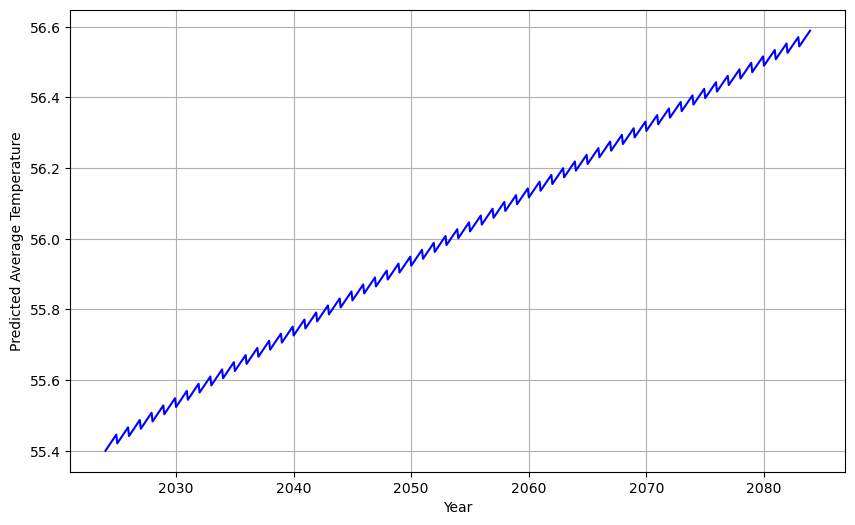

In [14]:
predictions = np.array(predictions).reshape(-1)

offset = 55.4 - predictions[0]
predictions += offset

years_float = date_predict[:, 0] + (date_predict[:, 1] - 1) / 12

plt.figure(figsize=(10, 6))
plt.plot(years_float, predictions, color='blue')
plt.xlabel('Year')
plt.ylabel('Predicted Average Temperature')
plt.grid(True)
plt.show()

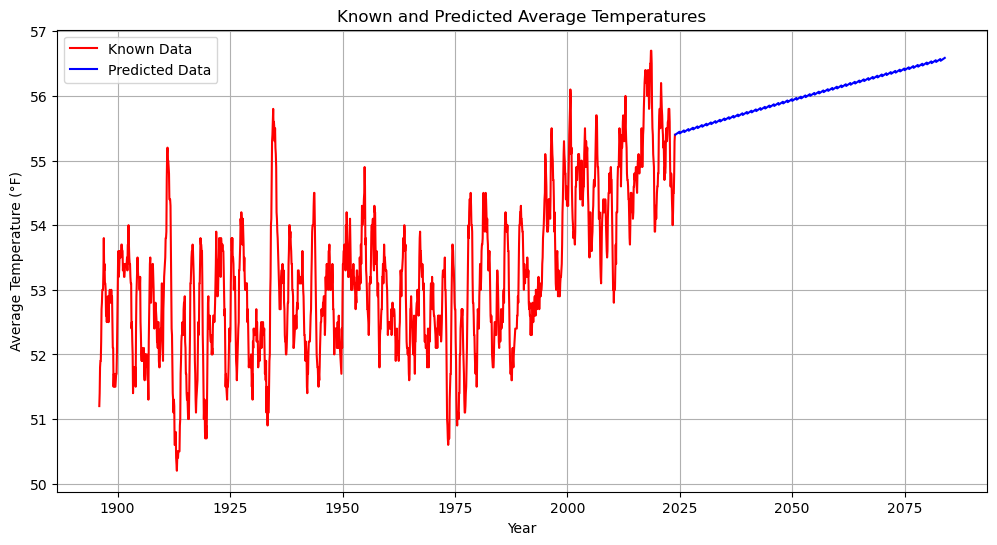

In [15]:

# Reload the known temperature data and process it
known_temperatures = pd.read_csv('./data/data_avg_temp.csv')

# Rename columns for clarity
known_temperatures.columns = ['date', 'avg_temp', 'avg_temp_anomaly']

# Drop the anomaly column as we don't need it
known_temperatures.drop(columns=['avg_temp_anomaly'], inplace=True)

# Convert the 'date' column from 'YYYYMM' format to datetime format
known_temperatures['date'] = pd.to_datetime(known_temperatures['date'].astype(str), format='%Y%m')

# Convert 'known_years' (which is in datetime format) to float years
known_years_float = known_temperatures['date'].dt.year + (known_temperatures['date'].dt.month - 1) / 12

# Extract the avg_temp values for plotting
known_temperatures_values = known_temperatures['avg_temp']

# Now, align the predictions with the last known temperature
offset = known_temperatures['avg_temp'].iloc[-1] - predictions[0]  # Align predictions to the last known temperature
predictions += offset  # Apply the offset to the predictions

# Generate the years for the prediction plot (assuming you have a date_predict array)
# Convert date_predict into floating-point years
years_float = date_predict[:, 0] + (date_predict[:, 1] - 1) / 12  # Adjust as necessary based on your prediction data

# Now, plot both known and predicted data
plt.figure(figsize=(12, 6))
plt.plot(known_years_float, known_temperatures_values, color='red', label='Known Data')  # Plot known data in red
plt.plot(years_float, predictions, color='blue', label='Predicted Data')  # Plot predicted data in blue
plt.xlabel('Year')
plt.ylabel('Average Temperature (°F)')
plt.title('Known and Predicted Average Temperatures')
plt.grid(True)
plt.legend()
plt.show()
